#  Oценить риск ДТП по выбранному маршруту движения

Нужно создать модель, которая могла бы оценить риск ДТП по выбранному маршруту движения. Под риском понимается вероятность ДТП с любым повреждением транспортного средства. Как только водитель забронировал автомобиль, сел за руль и выбрал маршрут, система должна оценить уровень риска. Если уровень риска высок, водитель увидит предупреждение и рекомендации по маршруту.

Идея создания такой системы находится в стадии предварительного обсуждения и проработки. Чёткого алгоритма работы и подобных решений на рынке ещё не существует. Текущая задача — понять, возможно ли предсказывать ДТП, опираясь на исторические данные одного из регионов.

Идея решения задачи от заказчика:

1. Создать модель предсказания ДТП (целевое значение — at_fault (виновник) в таблице parties) 
  - Для модели выбрать тип виновника — только машина (car).
  - Выбрать случаи, когда ДТП привело к любым повреждениям транспортного средства, кроме типа SCRATCH (царапина).
  - Для моделирования ограничиться данными за 2012 год — они самые свежие.
  - Обязательное условие — учесть фактор возраста автомобиля.
2. На основе модели исследовать основные факторы ДТП.   

3. Понять, помогут ли результаты моделирования и анализ важности факторов ответить на вопросы:
  - Возможно ли создать адекватную системы оценки водительского риска при выдаче авто?
  - Какие ещё факторы нужно учесть?
  - Нужно ли оборудовать автомобиль какими-либо датчиками или камерой?

Краткое описание таблиц: 
 - collisions — общая информация о ДТП. Имеет уникальный case_id. Эта таблица описывает общую информацию о ДТП. Например, где оно произошло и когда.
 - parties — информация об участниках ДТП. Имеет неуникальный case_id, который сопоставляется с соответствующим ДТП в таблице collisions. Каждая строка здесь описывает одну из сторон, участвующих в ДТП. Если столкнулись две машины, в этой таблице должно быть две строки с совпадением case_id. Если нужен уникальный идентификатор, это case_id and party_number.
 - vehicles — информация о пострадавших машинах. Имеет неуникальные case_id и неуникальные party_number, которые сопоставляются с таблицей collisions и таблицей parties. Если нужен уникальный идентификатор, это case_id and party_number.


## Подключимся к базе  и загрузим таблицы SQL

In [1]:
import matplotlib.pyplot as plt
import tqdm as notebook_tqdm
import plotly.express as px
import seaborn as sns
import pandas as pd
import numpy as np
import random
import time
import phik
import shap
import math

from tqdm import tqdm_notebook as tqdm
from sqlalchemy import create_engine

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
from sklearn.metrics import precision_recall_curve, PrecisionRecallDisplay
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler
from sklearn.compose import make_column_transformer, make_column_selector
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import make_pipeline
from sklearn.pipeline import Pipeline
from transformers import pipeline

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC

import lightgbm as lgb

RANDOM_STATE = 12345

shap.initjs()


In [2]:
db_config = {
'user': 'praktikum_student', # имя пользователя,
'pwd': 'Sdf4$2;d-d30pp', # пароль,
'host': 'rc1b-wcoijxj3yxfsf3fs.mdb.yandexcloud.net',
'port': 6432, # порт подключения,
'db': 'data-science-vehicle-db' # название базы данных,
} 

# строка подключения к базе данных
connection_string = 'postgresql://{}:{}@{}:{}/{}'.format(
    db_config['user'],
    db_config['pwd'],
    db_config['host'],
    db_config['port'],
    db_config['db']
)

engine = create_engine(connection_string) 

In [3]:
# пробным запросом проверим размер базы данных
sql_query = '''
SELECT pg_size_pretty(pg_database_size(current_database()));
'''
base = pd.read_sql_query(sql_query, con=engine)
base

,pg_size_pretty
0,790 MB


### Вывод

Успешно подключились к серверу.

## Первичное исследование таблиц

Используя sql-запросы выяснить:
 - все ли таблицы имеют набор данных;
 - соответствует ли количество таблиц условию задачи;
 - имеется ли общий ключ для связи таблиц.

In [4]:
# выведем названия таблиц 
sql_query = '''
SELECT table_name
  FROM information_schema.tables
 WHERE table_schema NOT IN ('information_schema','pg_catalog');
'''
tables_name = pd.read_sql_query(sql_query, con=engine)
tables_name

,table_name
0,case_ids
1,collisions
2,parties
3,vehicles


In [5]:
# выведем колонки данных таблиц
sql_query = '''
SELECT table_name, 
       column_name, 
       data_type 
  FROM information_schema.columns
 WHERE table_name IN ('case_ids', 'collisions', 'parties', 'vehicles');
'''
col_name = pd.read_sql_query(sql_query, con=engine)
col_name

,table_name,column_name,data_type
0,parties,party_number,integer
1,collisions,intersection,integer
2,parties,at_fault,integer
3,parties,insurance_premium,integer
4,collisions,distance,real
5,collisions,collision_date,date
6,parties,cellphone_in_use,integer
7,vehicles,id,integer
8,collisions,collision_time,time without time zone
9,vehicles,party_number,integer


In [6]:
# выведем первичные и внешние ключи
sql_query = '''
SELECT constraint_name,
       table_name,
       column_name
  FROM information_schema.key_column_usage
'''
sql_keys = pd.read_sql_query(sql_query, con=engine)
sql_keys

,constraint_name,table_name,column_name
0,pg_proc_oid_index,pg_proc,oid
1,pg_proc_proname_args_nsp_index,pg_proc,proname
2,pg_proc_proname_args_nsp_index,pg_proc,proargtypes
3,pg_proc_proname_args_nsp_index,pg_proc,pronamespace
4,pg_type_oid_index,pg_type,oid
...,...,...,...
162,parties_pk,parties,id
163,vehicles_pk,vehicles,id
164,collisions_case_ids_case_id_fk,collisions,case_id
165,parties_case_ids_case_id_fk,parties,case_id


В таблице collisions отсутствует первичный ключ, так как эта таблица описывает общую информацию о ДТП.

### Вывод

Данные в порядке и готовы к статическому анализу. 

##  Cтатистический анализ факторов ДТП

1. Выяснить, в какие месяцы происходит наибольшее количество аварий. 
 - проанализировать весь период наблюдений (sql-запросом из таблица collisions);
 - постройте график;
 - сделать вывод.
 ____
2. Аналитические задачи:
- проведите анализ серьёзности повреждений транспортного средства, исходя из состояния дороги в момент ДТП (collisions + parties);
- найдите самые частые причины ДТП (таблица parties);
- проведите анализ серьёзности повреждений транспортного средства, исходя из состояния водителя (collisions + parties);
- найдите самые частые типы кузовов участников ДТП(таблица parties);
- проведите анализ суммы страховки в зависимости от возраста автомобиля(vehicles + parties);
- проведите анализ типа ДТП от погодных факторов (collisions + parties).
___
Прописать порядок решения для двух задач из списка выше. Пример прописанного порядка:
- создать sql-запрос;
- постройть график;
- сделайть вывод.


In [7]:
# анализ общего количества аварий по месяцам за весь период наблюдений
sql_query = """
select COUNT(case_id) as collision_count, date_trunc('month', collision_date)::date as collision_date
from collisions
group by date_trunc('month', collision_date)
"""
collisions_count = pd.read_sql_query(sql_query, con=engine)
collisions_count.tail(21)

,collision_count,collision_date
35,34615,2011-12-01
36,32020,2012-01-01
37,30377,2012-02-01
38,32498,2012-03-01
39,29143,2012-04-01
40,25168,2012-05-01
41,3062,2012-06-01
42,390,2012-07-01
43,622,2012-08-01
44,510,2012-09-01


/var/folders/yj/nf1ww_kd4tn6clm3kqtxdfdm0000gn/T/ipykernel_9336/1040513490.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data =collisions_count,
/var/folders/yj/nf1ww_kd4tn6clm3kqtxdfdm0000gn/T/ipykernel_9336/1040513490.py:4: UserWarning: 
The palette list has fewer values (1) than needed (56) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(data =collisions_count,


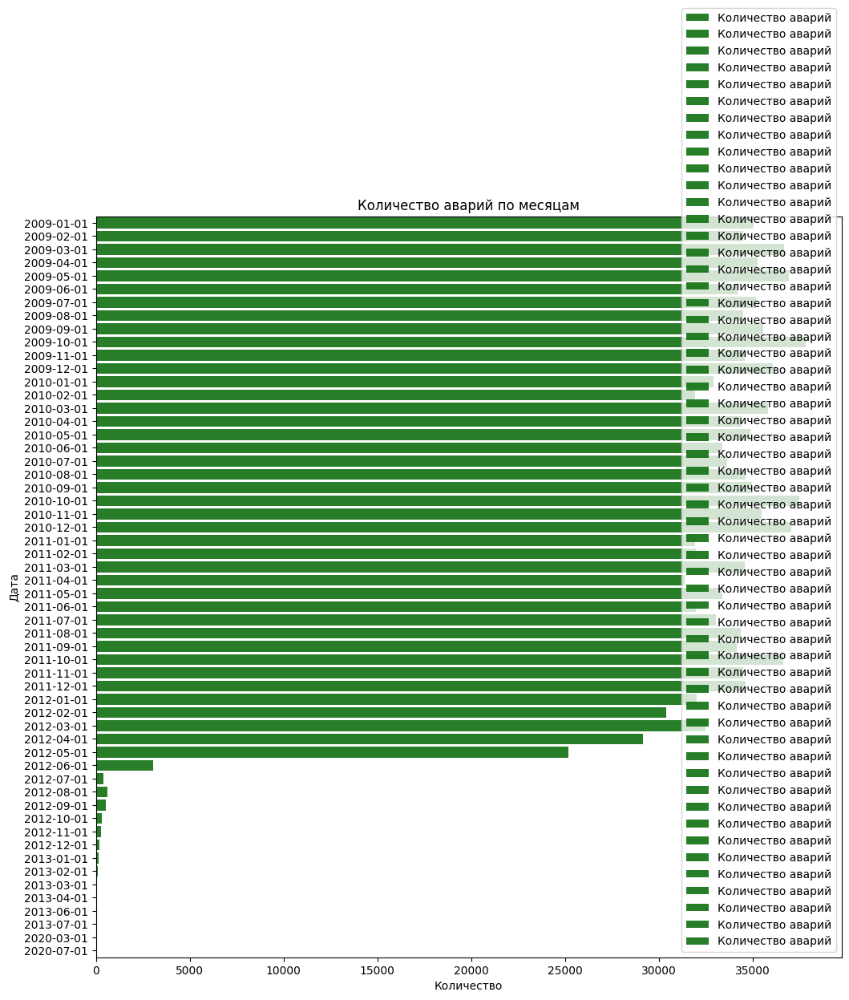

In [8]:
# выведем график
f, ax = plt.subplots(figsize=(12, 12))

sns.barplot(data =collisions_count, 
            x='collision_count',
            y = 'collision_date',
            palette = ['g'],
            alpha=0.9, label = 'Количество аварий', ax=ax)
ax.legend(ncol=1, loc="lower right",  frameon=True)
ax.set(xlabel="Количество",
       ylabel="Дата")
#plt.xticks(rotation=90)
plt.title("Количество аварий по месяцам")
plt.show()

### Вывод

Можно сделать вывод, что сбор статистики с мая 2012 года резко сократился. За весь период пики аварийности лежат на октябрь месяц, как месяц первых заморозков.  

_____

Проведем анализ 2-х аналитических задач из списка выше:

- ###  серьёзность повреждений ТС в зависимости от года выпуска автомобиля    (collisions + vehicles)

In [9]:
sql_query = '''
SELECT c.collision_damage,
       v.vehicle_age,
       COUNT(c.collision_damage) as damage_count
  FROM collisions AS c
       JOIN vehicles AS v ON c.case_id = v.case_id
 WHERE v.vehicle_age <= 15
       AND c.collision_damage != 'scratch'
 GROUP BY  c.collision_damage, v.vehicle_age;
'''
damage = pd.read_sql_query(sql_query, con=engine)
damage

,collision_damage,vehicle_age,damage_count
0,fatal,0,229
1,fatal,1,241
2,fatal,2,814
3,fatal,3,2478
4,fatal,4,1871
...,...,...,...
59,small damage,11,5901
60,small damage,12,3193
61,small damage,13,2236
62,small damage,14,946


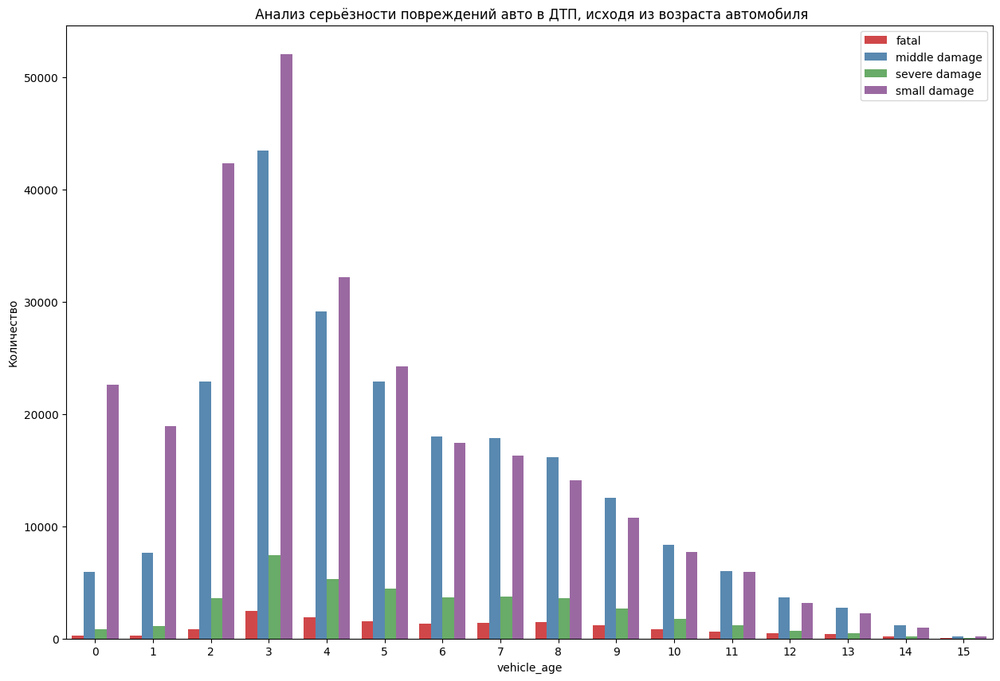

In [10]:
# выведем график
f, ax = plt.subplots(figsize=(15, 10))

sns.barplot(data =damage, 
            x='vehicle_age',
            y = 'damage_count',
            hue  = 'collision_damage',
            palette = "Set1",
            alpha=0.9)
ax.legend(ncol=1, loc="upper right", frameon=True)
ax.set(ylabel="Количество")
#plt.xticks(rotation=90)
plt.title(" Анализ серьёзности повреждений авто в ДТП, исходя из возраста автомобиля")
plt.show()

### Вывод

В основном маленькие повреждения преобладают в возрастной группе авто до 5 лет, с 6 лет доля средней тяжести повреждений увеличивается. Как видно на графике машины с 2 до 5 лет чаще остальных попадают в ДТП.

- ### анализ серьёзности повреждений транспортного средства, исходя из состояния водителя (collisions + parties);

In [11]:
sql_query = '''
SELECT p.party_drug_physical,
       c.collision_damage,
       COUNT(c.collision_damage) as col_count
  FROM collisions AS c
       JOIN parties AS p ON c.case_id = p.case_id
 WHERE p.party_drug_physical IN ('under drug influence', 
                                 'sleepy/fatigued', 'impairment - physical')
 GROUP BY p.party_drug_physical, c.collision_damage;
'''
drug_physical = pd.read_sql_query(sql_query, con=engine)
drug_physical


,party_drug_physical,collision_damage,col_count
0,impairment - physical,fatal,62
1,impairment - physical,middle damage,738
2,impairment - physical,scratch,1064
3,impairment - physical,severe damage,163
4,impairment - physical,small damage,2161
5,sleepy/fatigued,fatal,133
6,sleepy/fatigued,middle damage,2243
7,sleepy/fatigued,scratch,2859
8,sleepy/fatigued,severe damage,379
9,sleepy/fatigued,small damage,7027


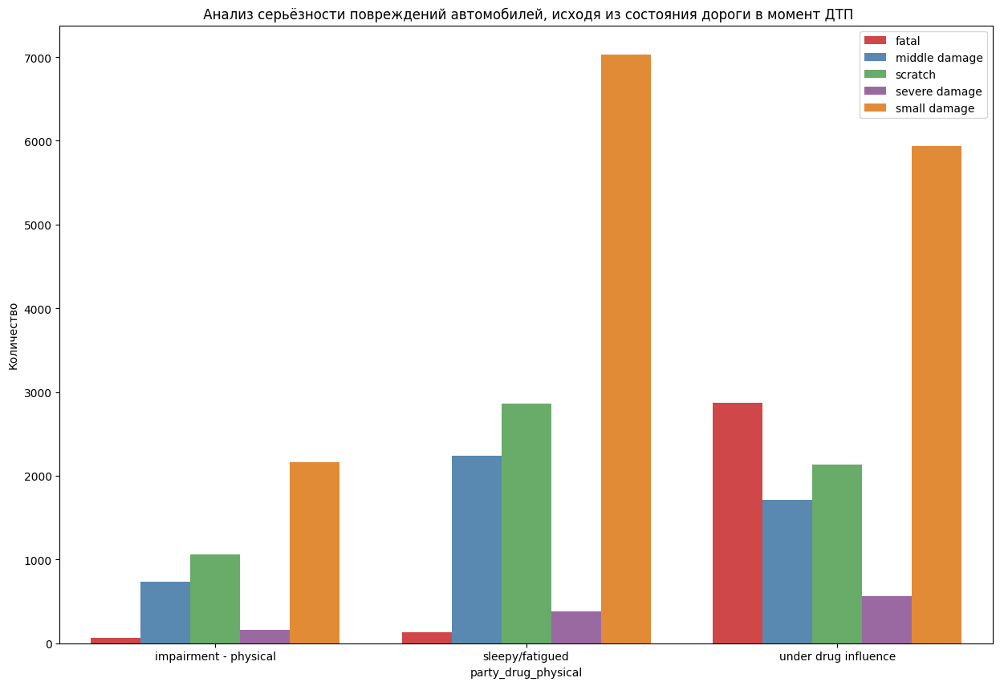

In [12]:
# выведем график
f, ax = plt.subplots(figsize=(15, 10))

sns.barplot(data =drug_physical, 
            x='party_drug_physical',
            y = 'col_count',
            hue  = 'collision_damage',
            palette = "Set1",
            alpha=0.9)
ax.legend(ncol=1, loc="upper right", frameon=True)
ax.set(ylabel="Количество")
#plt.xticks(rotation=90)
plt.title(" Анализ серьёзности повреждений автомобилей, исходя из состояния дороги в момент ДТП")
plt.show()

### Вывод

Тут становится очевидно, что водители под воздействием лекарств чаще попадают в аварии с фатальным исходом.

## Создадим модель для оценки водительского риска

Отфильтруем данные по параметрам заказчика:
- тип виновника — только машина (car);
- повреждения автомобиля любого из участников — все, кроме типа SCRATCH (царапина);
- данные только за 2012 год;
- подготовка исходной таблицы должна проводиться с помощью sql-запроса.

In [13]:
sql_query = '''
SELECT *
  FROM parties AS p
       FULL JOIN vehicles AS v ON p.case_id = v.case_id AND p.party_number = v.party_number
       FULL JOIN collisions AS c ON p.case_id = c.case_id
 WHERE p.party_type = 'car'
       AND c.collision_damage != 'scratch'
       AND c.collision_date BETWEEN '2012-01-01' AND '2012-12-31';
'''
# сброс ограничений на число столбцов
pd.set_option('display.max_columns', None)

df = pd.read_sql_query(sql_query, con=engine)
display(df.head())

,id,case_id,party_number,party_type,at_fault,insurance_premium,party_sobriety,party_drug_physical,cellphone_in_use,id,case_id,party_number,vehicle_type,vehicle_transmission,vehicle_age,case_id,county_city_location,county_location,distance,direction,intersection,weather_1,location_type,collision_damage,party_count,primary_collision_factor,pcf_violation_category,type_of_collision,motor_vehicle_involved_with,road_surface,road_condition_1,lighting,control_device,collision_date,collision_time
0,2685660,5615920,4,car,0,NaN,impairment unknown,G,0.0,NaN,None,NaN,None,None,NaN,5615920,1900,los angeles,128.0,north,0.0,clear,highway,small damage,4,vehicle code violation,speeding,rear end,other motor vehicle,dry,normal,daylight,none,2012-04-20,14:20:00
1,2473788,5491000,5,car,0,NaN,impairment unknown,G,0.0,NaN,None,NaN,None,None,NaN,5491000,1954,los angeles,100.0,north,0.0,clear,highway,small damage,5,vehicle code violation,speeding,rear end,other motor vehicle,dry,normal,daylight,none,2012-02-02,09:30:00
2,2484151,5496532,5,car,0,56.0,had not been drinking,None,0.0,NaN,None,NaN,None,None,NaN,5496532,1900,los angeles,200.0,south,0.0,clear,None,middle damage,5,vehicle code violation,speeding,rear end,other motor vehicle,dry,normal,daylight,functioning,2012-02-04,12:50:00
3,2566408,5540974,5,car,0,21.0,had not been drinking,None,0.0,1412449.0,5540974,5.0,coupe,auto,3.0,5540974,1942,los angeles,111.0,south,0.0,clear,None,middle damage,6,vehicle code violation,speeding,rear end,other motor vehicle,dry,normal,daylight,none,2012-03-05,14:35:00
4,2704655,5626124,5,car,0,53.0,had not been drinking,None,0.0,NaN,None,NaN,None,None,NaN,5626124,1942,los angeles,5.0,north,0.0,clear,highway,small damage,5,vehicle code violation,dui,rear end,other motor vehicle,dry,normal,daylight,none,2012-05-03,07:30:00


In [14]:
# выведем информацию о датафрейме
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 196837 entries, 0 to 196836
Data columns (total 35 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   id                           196837 non-null  int64  
 1   case_id                      196837 non-null  object 
 2   party_number                 196837 non-null  int64  
 3   party_type                   196837 non-null  object 
 4   at_fault                     196837 non-null  int64  
 5   insurance_premium            176607 non-null  float64
 6   party_sobriety               193212 non-null  object 
 7   party_drug_physical          25148 non-null   object 
 8   cellphone_in_use             171464 non-null  float64
 9   id                           56248 non-null   float64
 10  case_id                      56248 non-null   object 
 11  party_number                 56248 non-null   float64
 12  vehicle_type                 56248 non-null   object 
 13 

Удалим столбцы не влияющие на вероятность стать виновником ДТП.

In [15]:
df = df.drop(columns=['id', 'case_id', 'party_number',
                      'party_type', 'collision_time', 'county_city_location'])


In [16]:
# выделим месяц из даты

month_list = {1 : 'January',
              2 : 'February',
              3 : 'March',
              4 : 'April',
              5 : 'May',
              6 : 'June',
              7 : 'July',
              8 : 'August',
              9 : 'September',
              10 : 'October',
              11 : 'November',
              12 : 'December'}

df['collision_date'] = pd.to_datetime(df['collision_date'])
df['month'] = df['collision_date'].dt.month
del df['collision_date']
df['month'] = df['month'].replace(month_list)


In [17]:
# переименнуем названия столбцов по PEP8
df.rename(columns={'weather_1':'weather', 'road_condition_1':'road_condition'}, inplace=True)


In [18]:
# приведем значения строчных столбцов к нижнему регистру
for col in df.select_dtypes(include='object').columns:
        df[col] = df[col].str.lower()

In [19]:
# проверяем наличие пропусков в данных
df.isna().sum()

at_fault                            0
insurance_premium               20230
party_sobriety                   3625
party_drug_physical            171689
cellphone_in_use                25373
vehicle_type                   140589
vehicle_transmission           141448
vehicle_age                    142283
county_location                     0
distance                            0
direction                       42862
intersection                      987
weather                           654
location_type                  109480
collision_damage                    0
party_count                         0
primary_collision_factor          739
pcf_violation_category           3664
type_of_collision                1557
motor_vehicle_involved_with       837
road_surface                     1273
road_condition                   1143
lighting                          721
control_device                    973
month                               0
dtype: int64

Пропусков давольно много, будем разбираться. 

In [20]:
# проверяем данные на наличие дубликатов строк 
df.duplicated().sum()

1543

In [21]:
# удаляем дубликаты
df = df.drop_duplicates().reset_index(drop=True)

In [22]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
at_fault,195294.0,0.524030,0.499423,0.0,0.0,1.0,1.0,1.0
insurance_premium,175426.0,38.970660,16.237879,0.0,25.0,36.0,50.0,105.0
cellphone_in_use,170193.0,0.023767,0.152323,0.0,0.0,0.0,0.0,1.0
vehicle_age,54495.0,4.856831,3.235088,0.0,3.0,4.0,7.0,161.0
distance,195294.0,666.231688,7945.839140,0.0,10.0,102.0,500.0,1584000.0
intersection,194311.0,0.198517,0.398884,0.0,0.0,0.0,0.0,1.0
party_count,195294.0,2.104924,0.726376,1.0,2.0,2.0,2.0,12.0


Аномальные значения в столбцах 'vehicle_age', 'distance'.

Оценим каждый признак датафрейма:


- ### insurance_premium

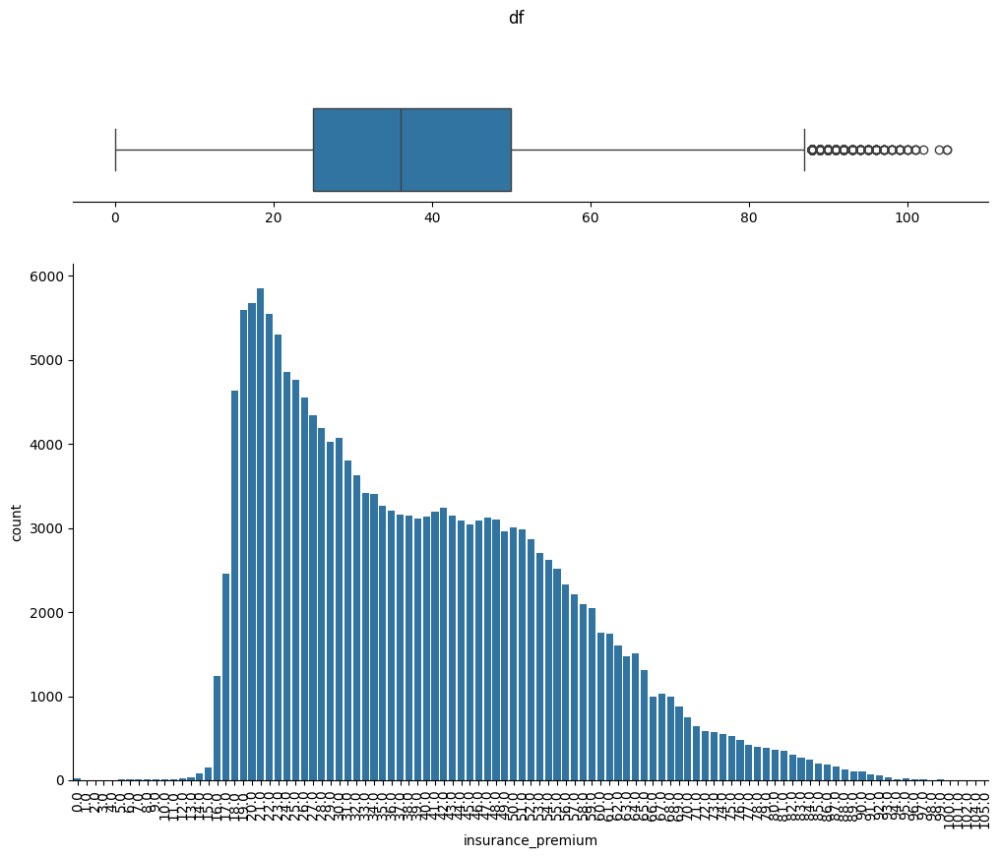

In [23]:
# выводим распределение по сумме страховки
f, (ax_1, ax_2) = plt.subplots(2, gridspec_kw={"height_ratios": (.15, .75)}, figsize=(12,9)) 
sns.boxplot(x=df['insurance_premium'], ax=ax_1) 
sns.countplot(x=df['insurance_premium'], ax=ax_2)
ax_1.set(yticks=[], xlabel=None)
sns.despine(ax=ax_1, left=True); sns.despine(ax=ax_2) 
ax_2.tick_params(axis= 'x', labelrotation=90); f.suptitle('df'); plt.show()


In [24]:
df['insurance_premium'].describe()

count    175426.000000
mean         38.970660
std          16.237879
min           0.000000
25%          25.000000
50%          36.000000
75%          50.000000
max         105.000000
Name: insurance_premium, dtype: float64

Распределение логорифмически-нормальное, без выбросов. Средняя выплата 38.95$ тыс

In [25]:
# Заполним пропуски в рандомном порядке от 0$ до 105$ тыс
def premium_std(x):
    if not math.isnan(x):
        return x
    if math.isnan(x):
        return random.randint(0, 105)
    
df['insurance_premium'] = df['insurance_premium'].apply(premium_std)

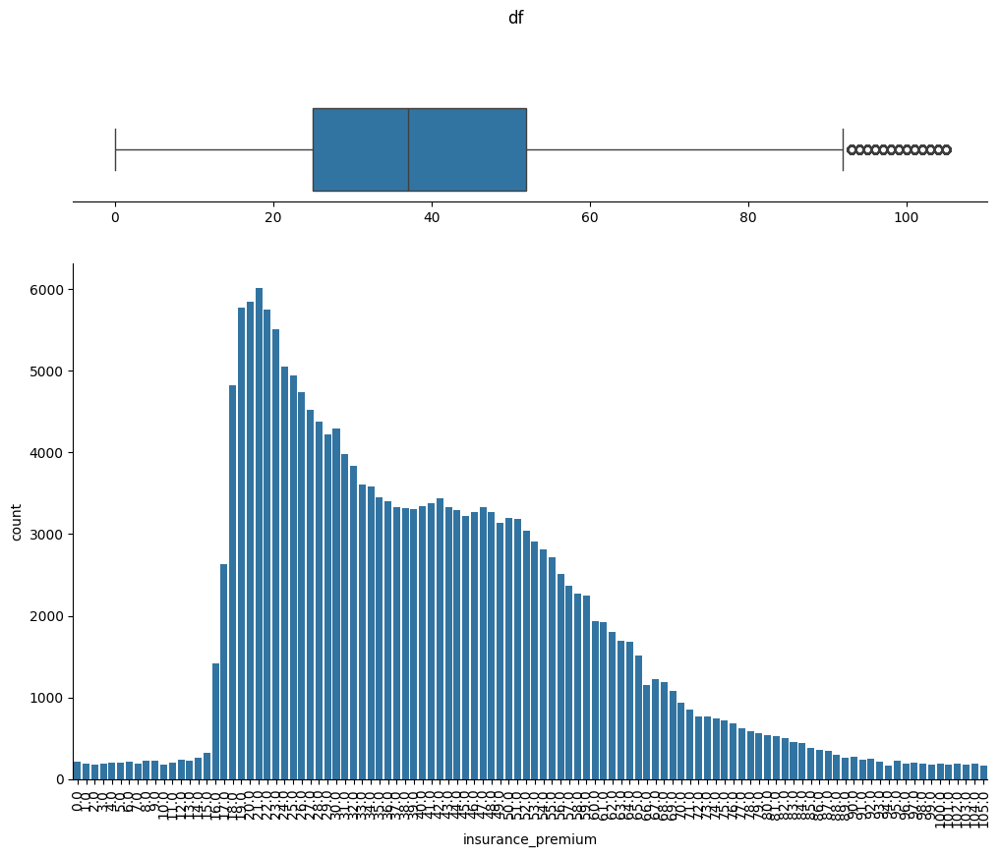

In [26]:
# выводим распределение по сумме страховки после заполнения пропусков
f, (ax_1, ax_2) = plt.subplots(2, gridspec_kw={"height_ratios": (.15, .75)}, figsize=(12,9)) 
sns.boxplot(x=df['insurance_premium'], ax=ax_1) 
sns.countplot(x=df['insurance_premium'], ax=ax_2)
ax_1.set(yticks=[], xlabel=None)
sns.despine(ax=ax_1, left=True); sns.despine(ax=ax_2) 
ax_2.tick_params(axis= 'x', labelrotation=90); f.suptitle('df'); plt.show()


- ### party_sobriety

In [27]:
# выводим значения по трезвости водителя
df['party_sobriety'].value_counts()


party_sobriety
had not been drinking                     156523
impairment unknown                         20174
had been drinking, under influence         10260
had been drinking, impairment unknown       1702
not applicable                              1671
had been drinking, not under influence      1350
Name: count, dtype: int64

Трезвось один из важных признаков и влияет на поведение водителя и может свидетельствовать о виновности или невиновности водителя. Пропуски заполним значением impairment unknown.

In [28]:
#заполним строки с пропусками в столбце party_sobriety
df['party_sobriety'] = df['party_sobriety'].fillna('impairment unknown')

- ### party_drug_physical

In [29]:
df['party_drug_physical'].value_counts()

party_drug_physical
g                        20174
not applicable            1671
under drug influence      1515
sleepy/fatigued           1096
impairment - physical      337
Name: count, dtype: int64

Воздействие лекарств также, один из важнейших признаков, заполним пропуски значением G-Impairment Unknown

In [30]:
#заполним строки с пропусками в столбце party_drug_physical
df['party_drug_physical'] = df['party_drug_physical'].fillna('impairment unknown')

party_drug_physical_map = {'g': 'impairment unknown'}

df['party_drug_physical'] = df['party_drug_physical'].apply(
    lambda x: party_drug_physical_map[x] if x in party_drug_physical_map else x)
                                                            

In [31]:
df['party_drug_physical'].value_counts()

party_drug_physical
impairment unknown       190675
not applicable             1671
under drug influence       1515
sleepy/fatigued            1096
impairment - physical       337
Name: count, dtype: int64

- ### cellphone_in_use 

In [32]:
df['cellphone_in_use'].value_counts()

cellphone_in_use
0.0    166148
1.0      4045
Name: count, dtype: int64

Пропуски в столбце наличие телефона в автомобиле выделим в отдельную группу 'unknown'

In [33]:
df['cellphone_in_use'] = df['cellphone_in_use'].fillna('unknown')
df['cellphone_in_use'] = df['cellphone_in_use'].replace(0, 'no')
df['cellphone_in_use'] = df['cellphone_in_use'].replace(1, 'yes')


- ### vehicle_type

In [34]:
df['vehicle_type'].value_counts()

vehicle_type
sedan    37156
coupe    19028
other        4
Name: count, dtype: int64

Много пропусков в признаке тип кузова, отнесем их числу other.

In [35]:
df['vehicle_type'] = df['vehicle_type'].fillna('other')

- ### vehicle_transmission 

Не думаю что тип коробки передач может коррелировать с виновностью в ДТП.

In [36]:
#удалим столбец vehicle_transmission
df = df.drop('vehicle_transmission', axis = 1)

- ### vehicle_age  

In [37]:
df['vehicle_age'].describe()


count    54495.000000
mean         4.856831
std          3.235088
min          0.000000
25%          3.000000
50%          4.000000
75%          7.000000
max        161.000000
Name: vehicle_age, dtype: float64

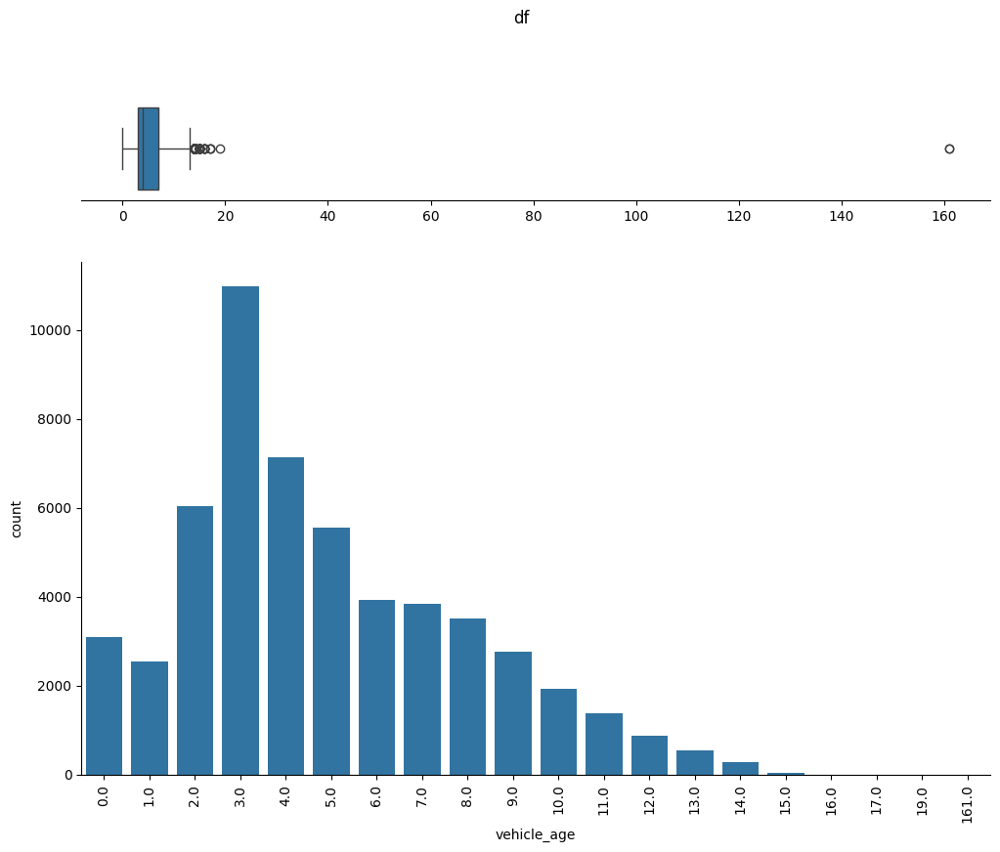

In [38]:
# выводим распределение по возрасту машины
f, (ax_1, ax_2) = plt.subplots(2, gridspec_kw={"height_ratios": (.15, .75)}, figsize=(12,9)) 
sns.boxplot(x=df['vehicle_age'], ax=ax_1) 
sns.countplot(x=df['vehicle_age'], ax=ax_2)
ax_1.set(yticks=[], xlabel=None)
sns.despine(ax=ax_1, left=True); sns.despine(ax=ax_2) 
ax_2.tick_params(axis= 'x', labelrotation=90); f.suptitle('df'); plt.show()


In [39]:
# машины старше 15 лет переобразуем в машины 15 лет
df['vehicle_age'] = df['vehicle_age'].apply(lambda x: 15 if x > 15 else x)

# Заполним пропуски в в столбце vehicle_age рандомном порядке от 2 до 7 лет
def vehicle_age(x):
    if not math.isnan(x):
        return x
    if math.isnan(x):
        return random.randint(2, 7)
    
df['vehicle_age'] = df['vehicle_age'].apply(vehicle_age)

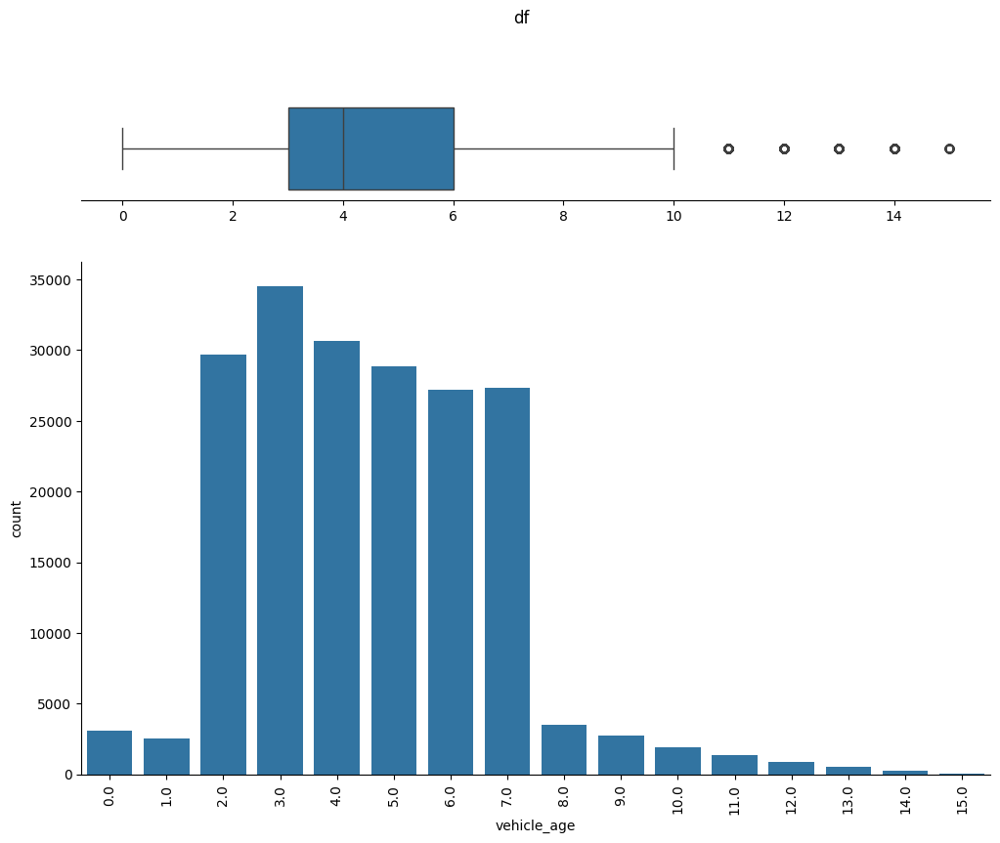

In [40]:
# выводим распределение по возрасту машины после заполнения пропусков
f, (ax_1, ax_2) = plt.subplots(2, gridspec_kw={"height_ratios": (.15, .75)}, figsize=(12,9)) 
sns.boxplot(x=df['vehicle_age'], ax=ax_1) 
sns.countplot(x=df['vehicle_age'], ax=ax_2)
ax_1.set(yticks=[], xlabel=None)
sns.despine(ax=ax_1, left=True); sns.despine(ax=ax_2) 
ax_2.tick_params(axis= 'x', labelrotation=90); f.suptitle('df'); plt.show()


In [41]:
df['vehicle_age'].describe()

count    195294.000000
mean          4.593940
std           2.191801
min           0.000000
25%           3.000000
50%           4.000000
75%           6.000000
max          15.000000
Name: vehicle_age, dtype: float64

После заполнения большого количества пропусков, распределение осталось почти на том же уровне. 

- ### county_location 

In [42]:
df['county_location'].value_counts()

county_location
los angeles        63356
orange             18399
san bernardino     11370
riverside          10737
san diego          10039
alameda             8197
sacramento          7461
santa clara         6987
ventura             4956
contra costa        4326
kern                4249
san mateo           3707
san joaquin         2963
fresno              2943
tulare              2892
santa barbara       2738
stanislaus          2489
sonoma              2379
monterey            2189
placer              2001
solano              1712
san francisco       1702
san luis obispo     1552
santa cruz          1510
marin               1500
merced              1268
yolo                1077
humboldt             956
butte                857
madera               832
shasta               767
el dorado            757
napa                 645
kings                608
nevada               564
mendocino            554
imperial             521
tehama               395
sutter               387
yuba     

В дальнейшем проверим корреляцию с целевым признаком.

- ### distance 

In [43]:
df['distance'].value_counts()

distance
0.0       42591
100.0      8033
200.0      6572
300.0      5536
50.0       5456
          ...  
8.5           1
1122.0        1
899.0         1
4202.0        1
79.8          1
Name: count, Length: 2321, dtype: int64

Также нужна проверка корреляции с целевым признаком. Удалим 1% выбросов в столбце.

In [44]:
df = df.query('distance < 8000').reset_index(drop=True)

- ### direction 

In [45]:
df['direction'].value_counts()

direction
north    42292
south    42143
west     33750
east     33457
Name: count, dtype: int64

Большое количество пропуcков выделим в отдельную группу 'unknown'.

In [46]:
df['direction'] = df['direction'].fillna('unknown')

- ### intersection

In [47]:
df['intersection'].value_counts()

intersection
0.0    153970
1.0     38574
Name: count, dtype: int64

Пропуcки выделим в отдельную группу 'unknown' и преобразуем в категориальный признак.

In [48]:
df['intersection'] = df['intersection'].fillna('unknown')
df['intersection'] = df['intersection'].replace(0, 'no')
df['intersection'] = df['intersection'].replace(1, 'yes')

- ### weather

In [49]:
df['weather'].value_counts()

weather
clear      154536
cloudy      29120
raining      8025
fog           573
snowing       407
other         170
wind           46
Name: count, dtype: int64

Пропуcки отнесем к группе 'other'

In [50]:
df['weather'] = df['weather'].fillna('other')

- ### location_type 

In [51]:
df['location_type'].value_counts()

location_type
highway         70242
ramp            11495
intersection     3911
Name: count, dtype: int64

Пропуски заполним значением 'other'

In [52]:
df['location_type'] = df['location_type'].fillna('other')

- ### collision_damage 

Ущерб при аварии - это последствия, а не причина. Удалим столбец.

In [53]:
# удалим столбец collision_damage
df = df.drop('collision_damage', axis = 1)

- ### party_count 

In [54]:
df['party_count'].value_counts()

party_count
2     134191
3      25616
1      24972
4       6559
5       1577
6        443
7         86
8         43
9         28
10        10
12         1
Name: count, dtype: int64

Нужно будет смотреть корреляцию с целевым признаком.

- ### primary_collision_factor & pcf_violation_category

Рассмотрим два похожих признака.

In [55]:
df['primary_collision_factor'].value_counts()

primary_collision_factor
vehicle code violation    183809
unknown                     4818
other than driver           3258
other improper driving       905
fell asleep                    6
Name: count, dtype: int64

In [56]:
df['pcf_violation_category'].value_counts()

pcf_violation_category
speeding                             68282
improper turning                     28046
automobile right of way              20458
unsafe lane change                   18200
dui                                  14066
traffic signals and signs             8922
unsafe starting or backing            7639
unknown                               5123
following too closely                 4522
wrong side of road                    3827
other than driver (or pedestrian)     3258
other hazardous violation             1885
improper passing                      1870
pedestrian violation                  1376
other improper driving                 905
pedestrian right of way                881
other equipment                        246
hazardous parking                      172
impeding traffic                       162
brakes                                  25
lights                                  19
fell asleep                              6
Name: count, dtype: int64

Второй болеее информативнее, удалим первый, пропуски во втором отнесем к 'unknown'

In [57]:
# удалим столбец primary_collision_factor
df = df.drop('primary_collision_factor', axis = 1)

In [58]:
df['pcf_violation_category'] = df['pcf_violation_category'].fillna('unknown')

- ### type_of_collision

In [59]:
df['type_of_collision'].value_counts()

type_of_collision
rear end      75780
sideswipe     40390
broadside     34046
hit object    23740
head-on        7424
other          7263
overturned     3337
Name: count, dtype: int64

Пропуски заполним значением 'other'.

In [60]:
df['type_of_collision'] = df['type_of_collision'].fillna('other')

- ### motor_vehicle_involved_with

In [61]:
df['motor_vehicle_involved_with'].value_counts()

motor_vehicle_involved_with
other motor vehicle               145110
fixed object                       22285
parked motor vehicle               10243
other object                        6591
non-collision                       3680
bicycle                             2729
motor vehicle on other roadway      1412
animal                               622
train                                 23
Name: count, dtype: int64

Пропуски заполним значением 'other object'.

In [62]:
df['motor_vehicle_involved_with'] = df['motor_vehicle_involved_with'].fillna('other object')

- ### road_surface

In [63]:
df['road_surface'].value_counts()

road_surface
dry         172615
wet          18642
snowy          858
slippery       147
Name: count, dtype: int64

Категорию slippery объединим со snowy, обе скользкие. Это один из важных признаков и для чистоты прогноза удалим пропуски, их меньше 1%. 

In [64]:
#удалим строки с пропусками в столбце road_surface
df = df.drop(df[df['road_surface'].isna()].index)
df.reset_index(drop= True , inplace= True )

road_surface_map = {'slippery': 'snowy'}

df['road_surface'] = df['road_surface'].apply(
    lambda x: road_surface_map[x] if x in road_surface_map else x)
df['road_surface'].value_counts()

road_surface
dry      172615
wet       18642
snowy      1005
Name: count, dtype: int64

- ### road_condition 

In [65]:
df['road_condition'].value_counts()

road_condition
normal            185668
construction        3277
other                749
obstruction          705
holes                446
loose material       293
reduced width        205
flooded              103
Name: count, dtype: int64

Пропуски заполним значением 'other'.

In [66]:
df['road_condition'] = df['road_condition'].fillna('other')

- ### lighting 

In [67]:
df['lighting'].value_counts()

lighting
daylight                                   133346
dark with street lights                     37556
dark with no street lights                  13841
dusk or dawn                                 6666
dark with street lights not functioning       438
Name: count, dtype: int64

Соединим категорию "Dark-Street Lights Not Functioning (Темно-Уличные фонари не работают)" c  Dark-No Street Lights (Темно-Нет уличных фонарей) смысл один и тот же. Также удалим пропуски, их меньше 0.5%.

In [68]:
df = df.drop(df[df['lighting'].isna()].index)
df.reset_index(drop= True , inplace= True )

lighting_map = {'dark with street lights not functioning': 'dark with no street lights'}

df['lighting'] = df['lighting'].apply(
    lambda x: lighting_map[x] if x in lighting_map else x)

df['lighting'].value_counts()

lighting
daylight                      133346
dark with street lights        37556
dark with no street lights     14279
dusk or dawn                    6666
Name: count, dtype: int64

- ### control_device

In [69]:
df['control_device'].value_counts()

control_device
none               129507
functioning         60997
not functioning       437
obscured              106
Name: count, dtype: int64

Признак сомнительный, будем смотреть на корреляцию. 'not functioning' и 'obscured' заменим на 'none' и пропуски отнесем к 'none'.

In [70]:
df['control_device'] = df['control_device'].fillna('none')

control_device_map = {'not functioning': 'none', 'obscured':'none'}

df['control_device'] = df['control_device'].apply(
    lambda x: control_device_map[x] if x in control_device_map else x)

df['control_device'].value_counts()

control_device
none           130850
functioning     60997
Name: count, dtype: int64

In [71]:
# проверяем наличие пропусков в данных
df.isna().sum()

at_fault                       0
insurance_premium              0
party_sobriety                 0
party_drug_physical            0
cellphone_in_use               0
vehicle_type                   0
vehicle_age                    0
county_location                0
distance                       0
direction                      0
intersection                   0
weather                        0
location_type                  0
party_count                    0
pcf_violation_category         0
type_of_collision              0
motor_vehicle_involved_with    0
road_surface                   0
road_condition                 0
lighting                       0
control_device                 0
month                          0
dtype: int64

In [72]:
# изменим тип данных
numeric = [
    'at_fault', 'insurance_premium', 'vehicle_age', 'distance', 'party_count' 
]

category = [
    'party_sobriety', 'party_drug_physical',
    'cellphone_in_use', 'vehicle_type', 
    'county_location', 'direction',
    'intersection', 'weather', 'location_type',
    'pcf_violation_category', 'type_of_collision', 
    'motor_vehicle_involved_with', 'road_surface',
    'road_condition', 'lighting', 'control_device',
    'month'       
]

df = df.astype({
    **{_:'int8' for _ in numeric},
    **{_:'category' for _ in category}
})

In [73]:
# проверим ещё раз на дубликаты после предобработки
df.duplicated().sum()

94

In [74]:
# удаляем дубликаты
df = df.drop_duplicates().reset_index(drop=True)

In [75]:
# выведем информацию о получившихся данных и типах
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 191753 entries, 0 to 191752
Data columns (total 22 columns):
 #   Column                       Non-Null Count   Dtype   
---  ------                       --------------   -----   
 0   at_fault                     191753 non-null  int8    
 1   insurance_premium            191753 non-null  int8    
 2   party_sobriety               191753 non-null  category
 3   party_drug_physical          191753 non-null  category
 4   cellphone_in_use             191753 non-null  category
 5   vehicle_type                 191753 non-null  category
 6   vehicle_age                  191753 non-null  int8    
 7   county_location              191753 non-null  category
 8   distance                     191753 non-null  int8    
 9   direction                    191753 non-null  category
 10  intersection                 191753 non-null  category
 11  weather                      191753 non-null  category
 12  location_type                191753 non-null

In [76]:
display(df.head(3))

,at_fault,insurance_premium,party_sobriety,party_drug_physical,cellphone_in_use,vehicle_type,vehicle_age,county_location,distance,direction,intersection,weather,location_type,party_count,pcf_violation_category,type_of_collision,motor_vehicle_involved_with,road_surface,road_condition,lighting,control_device,month
0,0,60,impairment unknown,impairment unknown,no,other,6,los angeles,-128,north,no,clear,highway,4,speeding,rear end,other motor vehicle,dry,normal,daylight,none,april
1,0,46,impairment unknown,impairment unknown,no,other,6,los angeles,100,north,no,clear,highway,5,speeding,rear end,other motor vehicle,dry,normal,daylight,none,february
2,0,56,had not been drinking,impairment unknown,no,other,3,los angeles,-56,south,no,clear,other,5,speeding,rear end,other motor vehicle,dry,normal,daylight,functioning,february


- ### целевой признак at_fault

at_fault
1    0.522834
0    0.477166
Name: proportion, dtype: float64


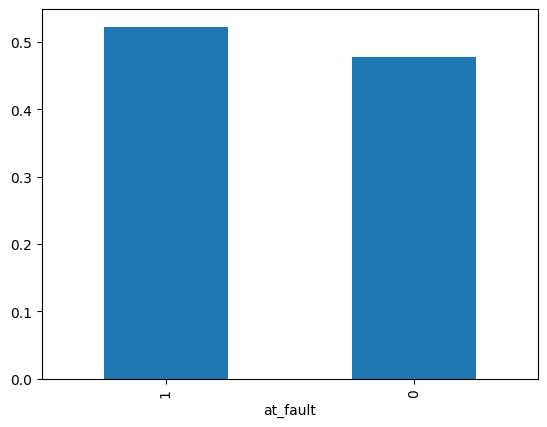

In [77]:
# проверим, как часто в целевом признаке встречается класс «1» или «0»
class_frequency = df['at_fault'].value_counts(normalize=True)
print(class_frequency)

class_frequency.plot(kind='bar')
plt.show()

В признаки почти равное соотношение положительных и отрицательных ответов.

In [78]:
# смотрим корреляцию признаков с целевым признаком
df.phik_matrix()['at_fault']

interval columns not set, guessing: ['at_fault', 'insurance_premium', 'vehicle_age', 'distance', 'party_count']


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/phik/phik.py:199: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  datahist = data_binned.groupby([c0, c1])[c0].count().to_frame().unstack().fillna(0)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/phik/phik.py:199: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  datahist = data_binned.groupby([c0, c1])[c0].count().to_frame().unstack().fillna(0)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/phik/phik.py:199: FutureWarning: The default of observed=False is deprecated and

at_fault                       1.000000
insurance_premium              0.246131
party_sobriety                 0.439287
party_drug_physical            0.079438
cellphone_in_use               0.044112
vehicle_type                   0.053500
vehicle_age                    0.078420
county_location                0.084008
distance                       0.053413
direction                      0.034251
intersection                   0.027700
weather                        0.033097
location_type                  0.108516
party_count                    0.207635
pcf_violation_category         0.386528
type_of_collision              0.243870
motor_vehicle_involved_with    0.344088
road_surface                   0.028085
road_condition                 0.022575
lighting                       0.142715
control_device                 0.085298
month                          0.008057
Name: at_fault, dtype: float64

interval columns not set, guessing: ['at_fault', 'insurance_premium', 'vehicle_age', 'distance', 'party_count']


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/phik/phik.py:199: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  datahist = data_binned.groupby([c0, c1])[c0].count().to_frame().unstack().fillna(0)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/phik/phik.py:199: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  datahist = data_binned.groupby([c0, c1])[c0].count().to_frame().unstack().fillna(0)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/phik/phik.py:199: FutureWarning: The default of observed=False is deprecated and

Text(0.5, 135.5815972222222, 'Признаки')

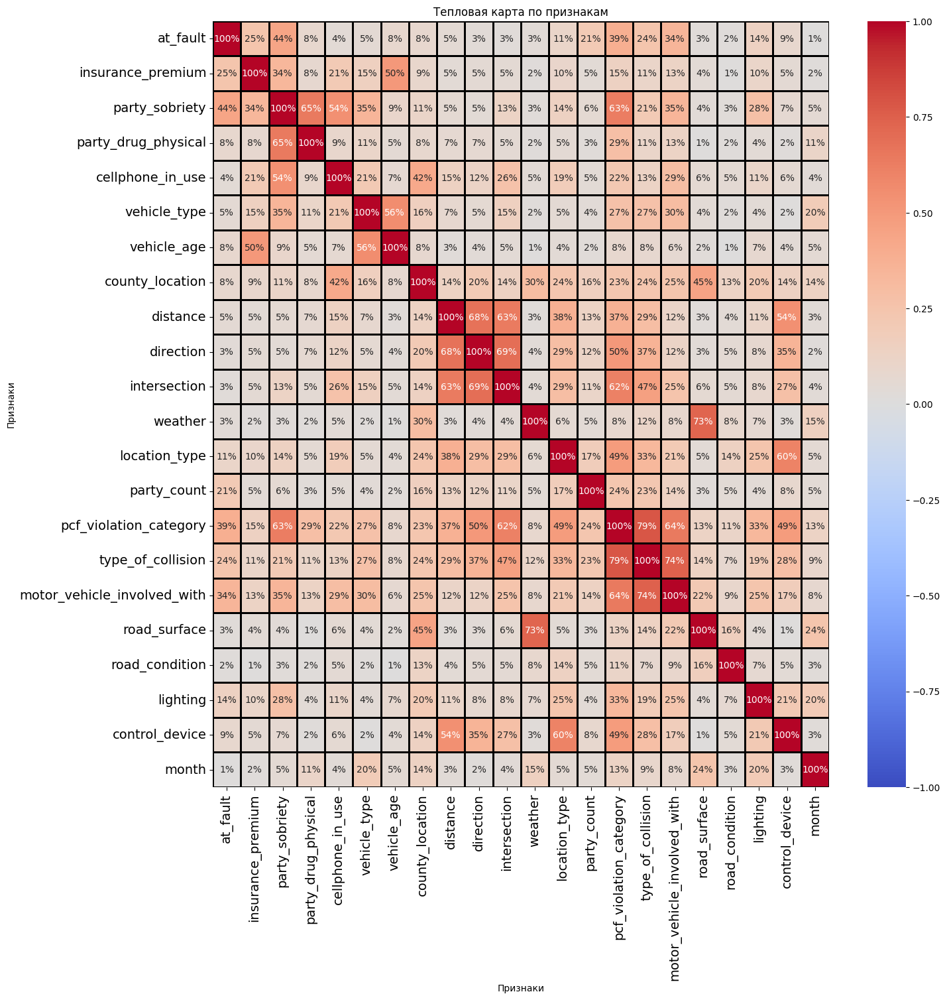

In [79]:
# тепловая таблица
plt.figure(figsize=(15, 15))
sns.heatmap(df.phik_matrix(), annot = True, fmt='.0%', vmin=-1, vmax=1, center= 0, cmap= 'coolwarm', linewidths=1, linecolor='black')
plt.title('Тепловая карта по признакам')
plt.xticks(fontsize=14, rotation=90)
plt.yticks(fontsize=14, rotation=360)
plt.ylabel('Признаки')
plt.xlabel('Признаки')


Для облегчения модели удалим столбцы с корреляцией меньше 5% к целевому признаку. 

In [80]:
drop = ['cellphone_in_use', 'direction', 'distance',
    'intersection', 'weather', 'road_surface',
    'road_condition', 'month']
df = df.drop(drop, axis=1)
display(df)

,at_fault,insurance_premium,party_sobriety,party_drug_physical,vehicle_type,vehicle_age,county_location,location_type,party_count,pcf_violation_category,type_of_collision,motor_vehicle_involved_with,lighting,control_device
0,0,60,impairment unknown,impairment unknown,other,6,los angeles,highway,4,speeding,rear end,other motor vehicle,daylight,none
1,0,46,impairment unknown,impairment unknown,other,6,los angeles,highway,5,speeding,rear end,other motor vehicle,daylight,none
2,0,56,had not been drinking,impairment unknown,other,3,los angeles,other,5,speeding,rear end,other motor vehicle,daylight,functioning
3,0,21,had not been drinking,impairment unknown,coupe,3,los angeles,other,6,speeding,rear end,other motor vehicle,daylight,none
4,0,53,had not been drinking,impairment unknown,other,5,los angeles,highway,5,dui,rear end,other motor vehicle,daylight,none
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191748,0,64,had not been drinking,impairment unknown,other,3,los angeles,highway,5,speeding,rear end,other motor vehicle,daylight,none
191749,0,81,had not been drinking,impairment unknown,other,5,los angeles,highway,4,speeding,rear end,other motor vehicle,daylight,none
191750,0,44,had not been drinking,impairment unknown,other,2,sonoma,highway,5,speeding,rear end,other motor vehicle,daylight,none
191751,0,43,had not been drinking,impairment unknown,other,7,orange,highway,7,speeding,rear end,other motor vehicle,daylight,none


In [81]:
# выделяем целевой признак и признаки:
target = df["at_fault"]
features = df.drop(["at_fault"], axis=1)

In [82]:
# выделяем 80% данных для обучающей выборки, остальные данные для тестовой .
features_train, features_test, target_train, target_test = train_test_split(features, 
                                                                            target, test_size = .2, 
                                                                            random_state = RANDOM_STATE)


 ## Найдём лучшую модель

Перед нами стоит задача бинарной классификации, для неё подходят следующие метрики оценки качества моделей: precision, recall и f1 мера. Precision можно интерпретировать как долю объектов, названных классификатором положительными и при этом действительно являющимися положительными, а recall показывает, какую долю объектов положительного класса из всех объектов положительного класса нашел алгоритм. Так как у нас необходимо угадать будет ли являться наш клиент виновником аварии, то мы выберем метрику recall.

### LogisticRegression

In [83]:
# трансформер для линейных моделей соберем из ОНЕ для категориальных, 
# к числовым - StandardScaler
linear_transformer = make_column_transformer(
    (OneHotEncoder(
        dtype='uint8',handle_unknown='ignore'),
     make_column_selector(
         dtype_include=['category', 'object'])),
    (StandardScaler(), make_column_selector(dtype_include='number')),
    remainder='passthrough')

In [84]:
# pipeline LogisticRegression
pipe_lr = make_pipeline(linear_transformer, LogisticRegression(class_weight='balanced', 
                                                               random_state=RANDOM_STATE))

In [85]:
# подбираем гиперпарамаметры для модели LogisticRegression
param_grid = {
    'logisticregression__solver':['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'logisticregression__C':[.001, .01, 0.1],
    'logisticregression__max_iter':[1000]
}

grid_lr = GridSearchCV(pipe_lr, 
                     param_grid, 
                     scoring='recall',  
                     verbose=1)

In [86]:
%%time 

# инициализируем модель LogisticRegression
grid_lr.fit(features_train, target_train)


Fitting 5 folds for each of 15 candidates, totalling 75 fits
CPU times: user 2min 28s, sys: 2.25 s, total: 2min 30s
Wall time: 2min 31s


GridSearchCV(estimator=Pipeline(steps=[('columntransformer',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('onehotencoder',
                                                                         OneHotEncoder(dtype='uint8',
                                                                                       handle_unknown='ignore'),
                                                                         <sklearn.compose._column_transformer.make_column_selector object at 0x2eff03e10>),
                                                                        ('standardscaler',
                                                                         StandardScaler(),
                                                                         <sklearn.compose._column_transformer.make_column_selector object at 0x2f00960d0>)])),
                                       ('logisticregression',
                                        LogisticRegression(class_weight='balanced',
                                                           random_state=12345))]),
             param_grid={'logisticregression__C': [0.001, 0.01, 0.1],
                         'logisticregression__max_iter': [1000],
                         'logisticregression__solver': ['newton-cg', 'lbfgs',
                                                        'liblinear', 'sag',
                                                        'saga']},
             scoring='recall', verbose=1)

In [87]:
# выведем основные метрики с помощью функции classification_report() 
prediction_lr = grid_lr.predict(features_test)

cr_lr = classification_report(target_test, prediction_lr, output_dict=True, zero_division=0)

results = {}

results['Logistic Regression'] = cr_lr['weighted avg']

pd.DataFrame(cr_lr).round(decimals=3).transpose()


,precision,recall,f1-score,support
0,0.641,0.880,0.742,18473.000
1,0.829,0.543,0.656,19878.000
accuracy,0.705,0.705,0.705,0.705
macro avg,0.735,0.711,0.699,38351.000
weighted avg,0.739,0.705,0.697,38351.000


### LinearSVC

In [88]:
# pipeline LinearSVC
#pipe_svc = make_pipeline(linear_transformer,
#                         LinearSVC(class_weight='balanced', 
#                                   random_state=RANDOM_STATE))
#


In [89]:
# подбираем гиперпарамаметры для модели LinearSVC
#param_grid = {
#    'linearsvc__loss':['hinge', 'squared_hinge'],
#    'linearsvc__C':[0.0001, .001, .01]
#}

#grid_svc = GridSearchCV(pipe_svc, 
#                      param_grid, 
#                      scoring='recall', 
#                      n_jobs=-1, 
#                      verbose=1)


In [90]:
#%%time

# инициализируем модель LinearSVC
#grid_svc.fit(features_train, target_train)


In [91]:
# выведем основные метрики с помощью функции classification_report() 
#prediction_svc = grid_svc.predict(features_test)

#cr_svc = classification_report(target_test, prediction_svc,output_dict=True, zero_division=0)

#results['LinearSVC'] = cr_svc['weighted avg']

#pd.DataFrame(cr_svc).round(decimals=3).transpose()

### RandomForestClassifier

In [100]:
# трансформер для различных колонок из ОЕ для категориальных признаков, 
# числовые оставим как есть.
ensemble_transformer = make_column_transformer(
    (OrdinalEncoder(
        dtype='int16', handle_unknown='use_encoded_value', unknown_value=-1),
     make_column_selector(
         dtype_include=['category', 'object'])),
    remainder='passthrough')


In [93]:
# pipeline RandomForestClassifier
#pipe_rf = make_pipeline(ensemble_transformer,
#    RandomForestClassifier(class_weight='balanced', 
#                           n_jobs=-1,
#                           verbose=0,
#                           random_state=RANDOM_STATE))


In [94]:
#param_grid = {
#    'randomforestclassifier__n_estimators':np.arange(50, 151, 50),
#    'randomforestclassifier__max_depth':np.arange(1, 11, 2)
#}

#grid_rf = GridSearchCV(pipe_rf, 
#                     param_grid, 
#                     scoring='recall', 
#                     n_jobs=-1, 
#                     verbose=1)

In [97]:
#%%time 

# инициализируем модель LightGBM
#grid_rf.fit(features_train, target_train)


In [98]:
# выведем основные метрики с помощью функции classification_report() 
#prediction_rf = grid_rf.predict(features_test)

#cr_rf = classification_report(target_test, prediction_rf, output_dict=True, zero_division=0)

#results['Random Forest Classifier'] = cr_rf['weighted avg']

#pd.DataFrame(cr_rf).round(decimals=3).transpose()

### LightGBM

In [101]:
# pipeline LightGBM
pipe_gbm = make_pipeline(ensemble_transformer,
    lgb.LGBMClassifier(objective='binary',
                       metric='recall', 
                       n_jobs=-1, 
                       verbosity=-1, 
                       random_state=RANDOM_STATE))



In [102]:
# подбираем гиперпарамаметры для модели LightGBM
param_grid = {
    'lgbmclassifier__max_depth':[-1, 10, 20],
    'lgbmclassifier__num_leaves':[10, 31],
    'lgbmclassifier__learning_rate':[.1, .5]
}
              
grid_gbm = GridSearchCV(pipe_gbm, 
                      param_grid, 
                      scoring='recall',  
                      n_jobs=-1, 
                      verbose=1)


In [103]:
%%time 

# инициализируем модель LightGBM
grid_gbm.fit(features_train, target_train)


Fitting 5 folds for each of 12 candidates, totalling 60 fits
CPU times: user 1.18 s, sys: 603 ms, total: 1.78 s
Wall time: 21.7 s


GridSearchCV(estimator=Pipeline(steps=[('columntransformer',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('ordinalencoder',
                                                                         OrdinalEncoder(dtype='int16',
                                                                                        handle_unknown='use_encoded_value',
                                                                                        unknown_value=-1),
                                                                         <sklearn.compose._column_transformer.make_column_selector object at 0x2f004b810>)])),
                                       ('lgbmclassifier',
                                        LGBMClassifier(metric='recall',
                                                       n_jobs=-1,
                                                       objective='binary',
                                                       random_state=12345,
                                                       verbosity=-1))]),
             n_jobs=-1,
             param_grid={'lgbmclassifier__learning_rate': [0.1, 0.5],
                         'lgbmclassifier__max_depth': [-1, 10, 20],
                         'lgbmclassifier__num_leaves': [10, 31]},
             scoring='recall', verbose=1)

In [104]:
# выведем основные метрики с помощью функции classification_report() 
prediction_gbm = grid_gbm.predict(features_test)

cr_gbm = classification_report(target_test, prediction_gbm, output_dict=True, zero_division=0)

results['Light GBM'] = cr_gbm['weighted avg']

pd.DataFrame(cr_gbm).round(decimals=3).transpose()

,precision,recall,f1-score,support
0,0.676,0.831,0.745,18473.000
1,0.800,0.629,0.705,19878.000
accuracy,0.726,0.726,0.726,0.726
macro avg,0.738,0.730,0.725,38351.000
weighted avg,0.740,0.726,0.724,38351.000


### Вывод

In [105]:
pd.DataFrame(results).drop(index='support').round(decimals=3).T.sort_values(
    by = 'recall', ascending=False)


,precision,recall,f1-score
Light GBM,0.740,0.726,0.724
Logistic Regression,0.739,0.705,0.697


Лучше остальных себя показала модель LightGBM.

## Проверим лучшую модель 

Проведем графический анализ «Матрица ошибок». Выведите полноту и точность на график.

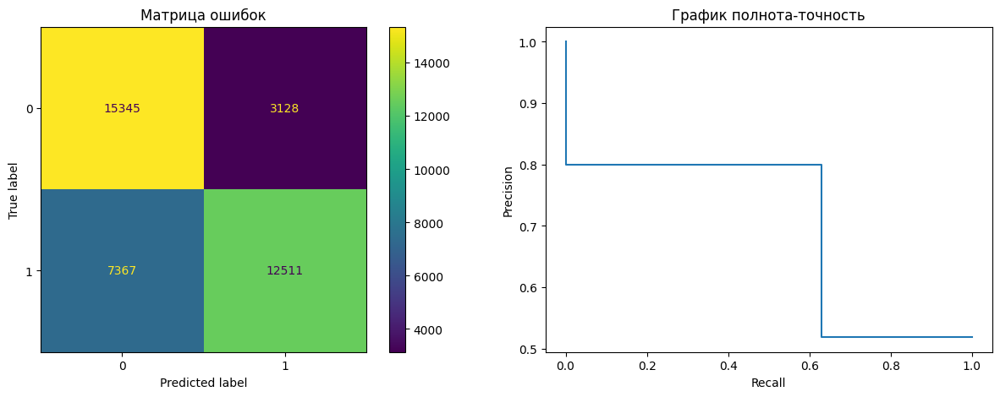

In [106]:
cm = confusion_matrix(target_test, prediction_gbm, labels=grid_gbm.classes_)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
cmd = ConfusionMatrixDisplay(cm, display_labels=grid_gbm.classes_)
cmd.plot(ax=ax1)
ax1.set_title('Матрица ошибок')
prec, recall, _ = precision_recall_curve(target_test, prediction_gbm)
PrecisionRecallDisplay(prec, recall).plot(ax=ax2)
ax2.set_title('График полнота-точность')
plt.show()

Много False Positive, в нашем случае может быть это и хорошо, модель с подозрительностью определяет виновника аварии 'на всякий случай'. Лучше увеличить страховку для ложно определенного клиента  по выбранному маршруту.

_______

## Проведём анализ важности факторов ДТП

In [107]:
X_encoded = grid_gbm.best_estimator_['columntransformer'].fit_transform(features)
model = grid_gbm.best_estimator_['lgbmclassifier'].fit(X_encoded, target)


In [108]:
#shap_test = shap.TreeExplainer(model).shap_values(features)
#shap.summary_plot(shap_test, features)

На решение о виновности в ДТП больше всего влияют:
- устройство управления;
- район, где произошло ДТП;
- трезвость участника;
- возраст автомобиля.


In [109]:
#fig = px.histogram(
#    df, x='control_device', color='at_fault',
#    barmode='group',
#    title='Зависимость виновности в ДТП от устройства управления (количество)',
#    histfunc='count'
#)
#fig.show()

При наличии устройства управления клиенты реже становятся виновниками ДТП, при отсутствии этого устройства наблюдаем более высокий уровень виновности клиентов.

In [110]:
#fig = px.histogram(
#    df, x='county_location', color='at_fault',
#    barmode='group',
#    title='Зависимость виновности в ДТП от района, где произошло ДТП (количество)',
#    histfunc='count'
#)
#fig.show()

Тут мы наблюдаем высокий уровень аварийности в Los Angeles, то есть при выдаче машины в этом районе должны быть учтены высокие риски попасть в аварию. (например, повышенная страховка)

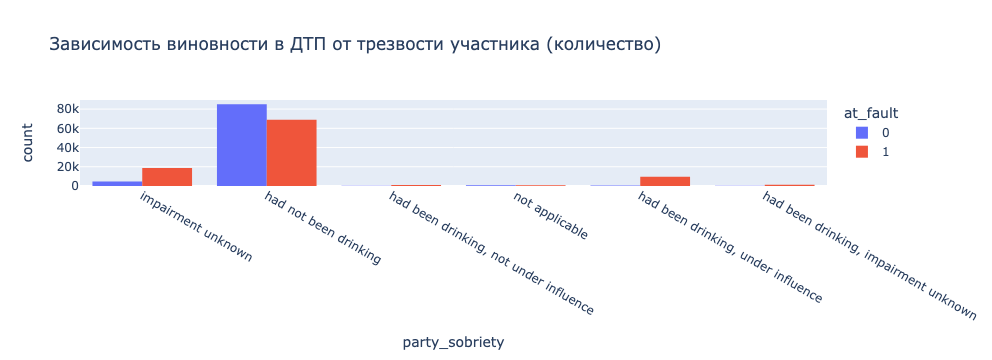

In [111]:
fig = px.histogram(
    df, x='party_sobriety', color='at_fault',
    barmode='group',
    title='Зависимость виновности в ДТП от трезвости участника (количество)',
    histfunc='count'
)
fig.show()

Этот признак отражает виновность в ДТП от трезвости участника, клиенты под каким-либо воздействием попадают в ДТП чаще.

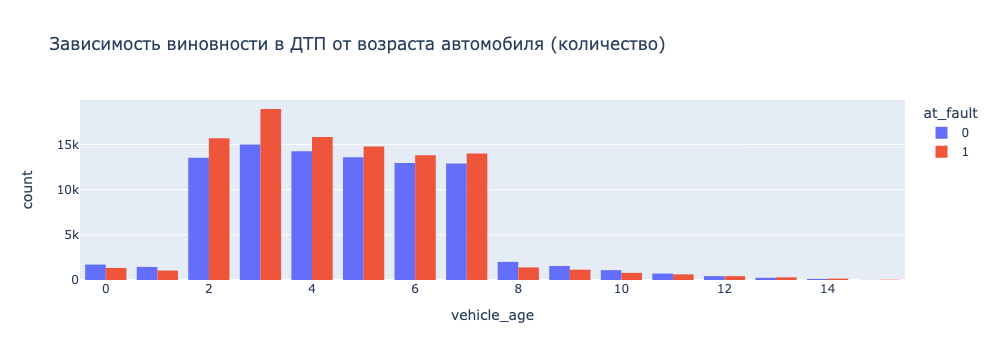

In [112]:
fig = px.histogram(
    df, x='vehicle_age', color='at_fault',
    barmode='group',
    title='Зависимость виновности в ДТП от возраста автомобиля (количество)',
    histfunc='count'
)
fig.show()

Тут интересная закономерность, чем старше автомобиль, тем меньше он бывает в ДТП. Чаще всего попадают в ДТП автомобили от 2 до 9 лет. 

### Вывод

По данным графикам можно сделать вывод, что каршеринговой компании нужно учитывать в цене (за 1 км) или тарифах использования автомобиля 
риски использования автомобиля в определенных районах(городах). Оборудовать машины устройством управления автомобиля и проверять на трезвость клиентов перед поездкой с идентификацией водителя (FaceID) и трубкой алкотестера. И также применять коэффициенты к цене в зависимоти от возраста автомобиля. 

## Заключение

Использовали модель LightGBM - это фреймворк, который предоставляет реализацию деревьев принятия решений с градиентным бустингом. Удалось обучить модель на тестовых данных и получить метрику recall равную 72.9%, precision - 74.3%, а f1 - 72.7%. 
 - True Positives - 33,5%
 - True Negatives - 39.6%
 - False Positives - 19.2%
 - False Negatives - 7.3%
 ___
К 19.2% клиентам будут применены излишние коэффициенты к цене(тарифу) проезда. А 7.3% клиентов будут упущены, как риск. Это небольшой процент, но можно его уменьшить! С представленными данными не получится получить предсказания с большой точностью, так как в основном мы имеем признаки последствия ДТП или косвеные признаки. Для улучшения качества предсказания виновника ДТП предлагаю собирать следующие данные:
- возраст водителя, который скоррелирован с манерой вождения;
- водительский стаж, который скоррелирован с опытом вождения в различных ситуациях;
- виды правонарушений за клиентом за определенный период (превышение скорости, опасное вождение, лишение прав за вождение в состоянии алкогольного опьянения и так далее);
____
Эти признаки могли бы улучшить модель и помочь каршеринговой компании более точно прогнизировать риски.